In [ ]:
###################  GALAXY GEM ###############################
######## Project Topic: Using Convolutional Neural Networks for Galaxy Morphology Classification ########
#######  Group Members:
#######  Tram Le – hle12@kent.edu
#######  Thi Minh Thu Nguyen – tnguye69@kent.edu
#######  Nickson Ibrahim Makama – nibrahi3@kent.edu
#######  Thanyaporn Noiplab – tnoiplab@kent.edu
###########################################################

In [ ]:
#This code puts google drive on collab
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#This code changes our current directory from content to /content/drive/MyDrive/GalaxyGem
%cd /content/drive/MyDrive/GalaxyGem

/content/drive/MyDrive/GalaxyGem


In [ ]:
#To confirm that we are inside the correct directory
!pwd

/content/drive/MyDrive/GalaxyGem


In [2]:
! pip install astroNN

In [8]:
#import the libraries that we will in this CNN
import tensorflow as tf
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import numpy as np
import cv2

from tensorflow import keras

from keras.models import Sequential
from keras.layers import Conv2D,MaxPooling2D, AveragePooling2D, Flatten, Dense, Dropout
from keras.callbacks import ReduceLROnPlateau
from keras.optimizers import Adam
# from keras.preprocessing.image import ImageDataGenerator
# from tensorflow.keras.preprocessing.image import ImageDataGenerator


import sklearn
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report,confusion_matrix
from tensorflow.keras import utils

from astroNN.datasets import galaxy10

from keras.models import Sequential, load_model
from keras.callbacks import EarlyStopping
from keras.layers import Conv2D, MaxPool2D, Flatten, Dense, Dropout
from keras.utils import to_categorical

from collections import Counter
# from sklearn.utils.class_weight import compute_class_weight


images_original, labels_original = galaxy10.load_data()
label = utils.to_categorical(labels_original, 10)
images_original.shape
# print(images)

label = label.astype(np.float32)
images = images_original.astype(np.float32)
print (label.shape[0])         # [17736, 256, 256, 3]

# features = ['Disturbed', 'Merging', 'Round Smooth', 'Smooth, Cigar shaped', 'Cigar Shaped Smooth', 'Barred Spiral',
#             'Unbarred Tight Spiral','Unbarred Loose Spiral', 'Edge-on without Bulge', 'Edge-on with Bulge']
features = ['0', '1', '2', '3', '4', '5', '6',
            '7','8', '9']
#------------------------------------------------------------------------------------------------

# Count the occurrences of each label
label_counts = Counter(labels_original)

# Print the number of images in each class
for class_label, count in label_counts.items():
    print(f"Class {class_label}: {count} images")

/Users/tramle/.astroNN/datasets/Galaxy10_DECals.h5 was found!
17736
Class 0: 1081 images
Class 1: 1853 images
Class 2: 2645 images
Class 3: 2027 images
Class 4: 334 images
Class 5: 2043 images
Class 6: 1829 images
Class 7: 2628 images
Class 8: 1423 images
Class 9: 1873 images


zsh:1: command not found: nvidia-smi
No GPU Available


/var/folders/6z/_3s8vznx77ngnml5pdjyjn0h0000gn/T/ipykernel_10967/3402225442.py:20: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.


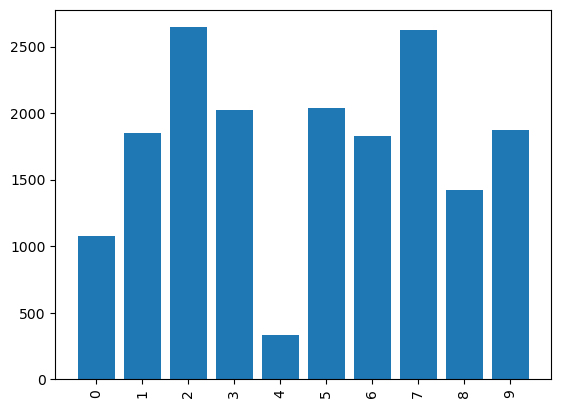

In [9]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

if tf.config.list_physical_devices('GPU'):
    print("yes GPU Available")
    print(tf.config.list_physical_devices('GPU'))
else:
    print("No GPU Available")

df = pd.DataFrame(data=labels_original)

counts = df.value_counts().sort_index()
def class_distribution(x, y, labels):
    fig, ax = plt.subplots()
    ax.bar(x, y)
    ax.set_xticklabels(labels, rotation=90)
    plt.show()

class_distribution(features, counts, features)

In [21]:
import plotly.express as px

label_counts = Counter(labels_original)

# Convert the label counts to a list for plotting
labels = list(label_counts.keys())
counts = list(label_counts.values())

# Create a DataFrame for Plotly
df = pd.DataFrame({
    'Class': labels,
    'Count': counts
})

# Plot using Plotly
fig = px.bar(df, x='Class', y='Count', text='Count', title='Number of images before data augmentation')
fig.write_image("beforeprocess.png", scale=2)


# Show the plot
fig.show()

In [14]:

#----------------INCREASE NO OF IMAGES IN CLASS 4-------------------------------------------
# from keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing.image import ImageDataGenerator
# from keras.preprocessing.image import ImageDataGenerator


import numpy as np
from collections import Counter

# Calculate the number of images needed to triple the count for class 4
class_4_count = label_counts[4]
desired_count = class_4_count * 3

# Filter out images and labels belonging to class 4
class_4_indices = np.where(labels_original == 4)[0]

class_4_images = images_original[class_4_indices]
class_4_labels = labels_original[class_4_indices]

# Define data augmentation parameters
datagen_class_4 = ImageDataGenerator(
    rotation_range=90,
    height_shift_range=0.2,
    width_shift_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True
)

# Fit data generator on class 4 images
datagen_class_4.fit(class_4_images)

# Generate additional images for class 4
generated_images = []
generated_labels = []

for X_batch, y_batch in datagen_class_4.flow(class_4_images, class_4_labels, batch_size=1):
    generated_images.append(X_batch[0])
    generated_labels.append(4)  # Since it's class 4
    if len(generated_images) >= desired_count:
        break

# Convert the generated images and labels to numpy arrays
generated_images = np.array(generated_images)
generated_labels = np.array(generated_labels)

# Concatenate the generated images and labels with the original training data
images = np.concatenate((images_original, generated_images))
labels = np.concatenate((labels_original, generated_labels))
# Convert labels to one-hot encoding
labels = to_categorical(labels, num_classes=len(features))


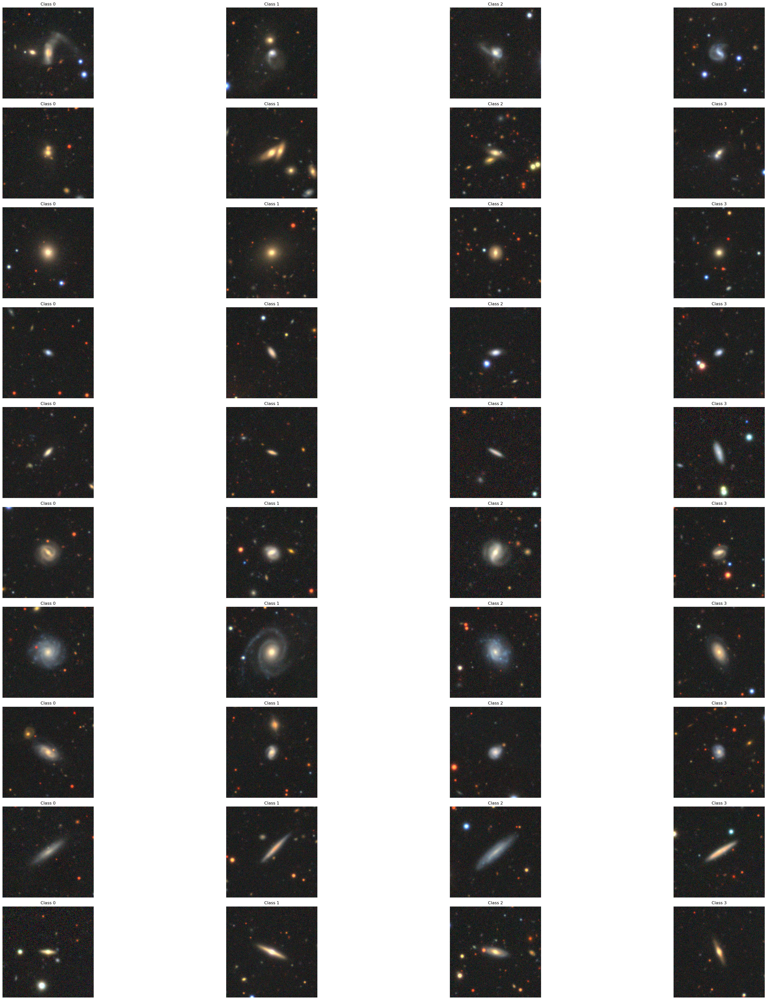

In [15]:
import matplotlib.pyplot as plt
import numpy as np
# Define the number of classes
num_classes = len(np.unique(labels_original))

# Define the number of images to display from each class
num_images_per_class = 4

# Set up the figure
plt.figure(figsize=(40, 40))

# Iterate through each class
for class_idx in range(num_classes):
    # Filter images and labels belonging to the current class
    class_indices = np.where(labels_original == class_idx)[0]
    class_images = images_original[class_indices]

    # Display four images from the current class
    for i in range(min(num_images_per_class, len(class_images))):
        plt.subplot(num_classes, num_images_per_class, class_idx * num_images_per_class + i + 1)
        plt.imshow(class_images[i])
        plt.title(f"Class {features[i]}")
        plt.axis('off')

plt.tight_layout()
plt.show()


In [16]:
print("len(images original", len(images_original))
print("len(labels original", len(labels_original))

print("")
print("len(images after increased", len(images), ", correct: ", 17736+334*3)
print("len(labels after increased", len(labels))
print("")

#----------Reprint number of images------------
# Convert one-hot encoded labels to original class labels
original_labels = np.argmax(labels, axis=1)

# Update the label counts after data augmentation
label_counts = Counter(original_labels)

# Print the number of images in each class
for class_label, count in label_counts.items():
    print(f"Class {class_label}: {count} images")





len(images original 17736
len(labels original 17736

len(images after increased 18738 , correct:  18738
len(labels after increased 18738

Class 0: 1081 images
Class 1: 1853 images
Class 2: 2645 images
Class 3: 2027 images
Class 4: 1336 images
Class 5: 2043 images
Class 6: 1829 images
Class 7: 2628 images
Class 8: 1423 images
Class 9: 1873 images


In [30]:
# Create a DataFrame for Plotly
df = pd.DataFrame({'Class': original_labels})

# Count occurrences of each class
counts = df['Class'].value_counts().sort_index()

# Convert the counts to a DataFrame
counts_df = pd.DataFrame({
    'Class': counts.index,
    'Count': counts.values
})
default_colors = px.colors.qualitative.Plotly
colors = [default_colors[i % len(default_colors)] if i != 4 else 'pink' for i in range(len(counts_df))]

# Plot using Plotly
fig = px.bar(counts_df, x='Class', y='Count', text='Count', title='Number of images After Data Augmentation')
fig.update_traces(marker=dict(color=colors))
fig.write_image("after_process.png", scale=2)

# Show the plot
fig.show()


/var/folders/6z/_3s8vznx77ngnml5pdjyjn0h0000gn/T/ipykernel_10967/3402225442.py:20: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.



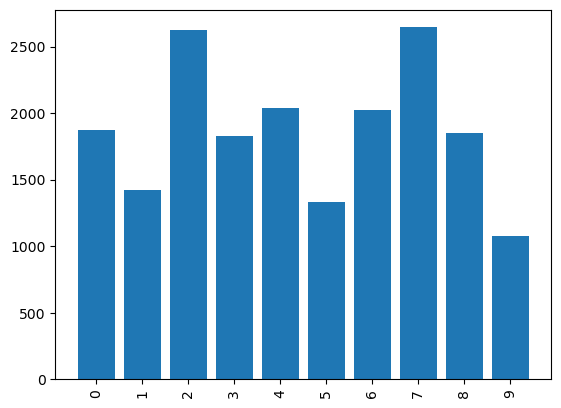

In [17]:
df = pd.DataFrame(data=labels)

counts = df.value_counts().sort_index()
class_distribution(features, counts, features)

In [ ]:

# -----------------------------SPLIT DATA--------------------------------------------------
# Split dataset to 80% training , 10% testing, and 10% validating


# # Split the original training set into training and validation sets
train_x, test_x = train_test_split(np.arange(labels.shape[0]), test_size=0.2)
train_images, train_labels, test_images, test_labels = images[train_x], labels[train_x], images[test_x], labels[test_x]

# Split the test set into test and validation sets
val_x, test_x = train_test_split(test_x, test_size=0.5)  # 0.5 ≈ 10%/20%
val_images, test_images, val_labels, test_labels = images[val_x], images[test_x], labels[val_x], labels[test_x]

In [ ]:
#--------------------------------RESIZE IMAGES TO 128x128-----------------------------------------------------
# Define the target image size

target_size = (128, 128)

# Resize the images
train_images_resized = np.array([cv2.resize(image, target_size) for image in train_images])
test_images_resized = np.array([cv2.resize(image, target_size) for image in test_images])
val_images_resized = np.array([cv2.resize(image, target_size) for image in val_images])


# Check the shape of the resized images
print("Number of images in each set: ")
print("Resized training images shape:", train_images_resized.shape)
print("Resized test images shape:", test_images_resized.shape)
print("Resized validation images shape:", val_images_resized.shape)

Number of images in each set: 
Resized training images shape: (14990, 128, 128, 3)
Resized test images shape: (1874, 128, 128, 3)
Resized validation images shape: (1874, 128, 128, 3)


In [ ]:
#------------------------------------------------------------------------------------------------
print("----------------------------------------------")
print("Number of images in each set: ")
print ("Training set: ",len(train_x))
print ("Testing set: ",len(test_x))
print ("Validation set: ",len(val_x))


----------------------------------------------
Number of images in each set: 
Training set:  14990
Testing set:  1874
Validation set:  1874


In [ ]:
#------------------------CROPPING IMAGES-----------------------------------------------------
def crop_images(image_array, crop_size):
    cropped_images = []
    for image in image_array:
        # Get dimensions of the image
        height, width = image.shape[:2]

        # Calculate coordinates for cropping
        start_row, start_col = int((height - crop_size) / 2), int((width - crop_size) / 2)
        end_row, end_col = start_row + crop_size, start_col + crop_size

        # Crop the image
        cropped_image = image[start_row:end_row, start_col:end_col]
        cropped_images.append(cropped_image)

    return cropped_images

# Specify the size for cropping
crop_size = 500  #We can Adjust this value according to our requirement

# Crop the training, testing, and validation images
train_images_cropped = crop_images(train_images_resized, crop_size)
test_images_cropped = crop_images(test_images_resized, crop_size)
val_images_cropped = crop_images(val_images_resized, crop_size)

# Check the shape of the cropped images
print("----------------------------------------------")
print("Number of images in each set after cropping: ")
print("Cropped training images shape:", len(train_images_cropped))
print("Cropped test images shape:", len(test_images_cropped))
print("Cropped validation images shape:", len(val_images_cropped))


----------------------------------------------
Number of images in each set after cropping: 
Cropped training images shape: 14990
Cropped test images shape: 1874
Cropped validation images shape: 1874


In [ ]:

import cv2

# Value normalization
X_train = np.array(train_images_cropped, dtype='float32') / 255
X_test = np.array(test_images_cropped, dtype='float32') / 255
X_val = np.array(val_images_cropped, dtype='float32') / 255
print(f"X_train shape: {X_train.shape}")
input_shape = (X_train.shape[1], X_train.shape[2], 3)

print(input_shape)

X_train shape: (14990, 128, 128, 3)
(128, 128, 3)


In [ ]:
#--------------------------------DATA AUGMENTATION-------------------------------------------
# Rotate, vertical shift, horizontal shift, zoom, slip
datagen = ImageDataGenerator(
                             rotation_range=90,
                             height_shift_range=0.2,
                             width_shift_range=0.2,
                             zoom_range=0.4,
                             horizontal_flip=True,
                            )

datagen.fit(X_train)
datagen.fit(X_val)



```
# This is formatted as code
```

# Architecture

In [ ]:
#--------------------------MODEL------------------------------------------

model = Sequential()
model.add(Conv2D(16, (3, 3), activation='tanh', strides=(1, 1),
    padding='same', input_shape=input_shape))
model.add(Conv2D(32, (3, 3), activation='tanh', strides=(1, 1),
    padding='same'))
model.add(MaxPool2D((2, 2)))
model.add(Conv2D(32, (3, 3), activation='tanh', strides=(1, 1),
    padding='same'))
model.add(MaxPool2D((2, 2)))
model.add(Conv2D(32, (3, 3), activation='tanh', strides=(1, 1),
    padding='same'))
model.add(MaxPool2D((2, 2)))
model.add(Conv2D(32, (3, 3), activation='tanh', strides=(1, 1),
    padding='same'))
model.add(MaxPool2D((2, 2)))
model.add(Dropout(0.25))
model.add(Flatten())
model.add(Dense(32, activation='tanh'))
model.add(Dropout(0.5))
model.add(Dense(len(features), activation='softmax'))
model.summary()

model.compile(loss='categorical_crossentropy',
     optimizer='adam',
     metrics=['acc'])

es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=5)
batch_size=64


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 128, 128, 16)      448       
                                                                 
 conv2d_1 (Conv2D)           (None, 128, 128, 32)      4640      
                                                                 
 max_pooling2d (MaxPooling2  (None, 64, 64, 32)        0         
 D)                                                              
                                                                 
 conv2d_2 (Conv2D)           (None, 64, 64, 32)        9248      
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 32, 32, 32)        0         
 g2D)                                                            
                                                                 
 conv2d_3 (Conv2D)           (None, 32, 32, 32)        9

# Train Process

In [ ]:

history = model.fit(X_train, train_labels,
                    epochs=50,
                    steps_per_epoch = int(np.ceil(X_train.shape[0]/ float(64))) ,
                    batch_size=32, validation_data=(X_val, val_labels), callbacks=[es])

model_json = model.to_json()
with open("galaxy_model.json","w") as json_file:
    json_file.write(model_json)

model.save_weights("best_model.h5")

Epoch 1/50
235/235 [==============================] - 12s 20ms/step - loss: 2.0533 - acc: 0.2428 - val_loss: 1.7355 - val_acc: 0.3671
Epoch 2/50
235/235 [==============================] - 4s 19ms/step - loss: 1.6798 - acc: 0.3991 - val_loss: 1.4858 - val_acc: 0.4781
Epoch 3/50
235/235 [==============================] - 4s 15ms/step - loss: 1.5027 - acc: 0.4713 - val_loss: 1.3713 - val_acc: 0.5288
Epoch 4/50
235/235 [==============================] - 4s 15ms/step - loss: 1.4359 - acc: 0.4987 - val_loss: 1.2518 - val_acc: 0.5763
Epoch 5/50
235/235 [==============================] - 4s 15ms/step - loss: 1.2903 - acc: 0.5634 - val_loss: 1.1953 - val_acc: 0.5923
Epoch 6/50
235/235 [==============================] - 4s 15ms/step - loss: 1.2785 - acc: 0.5648 - val_loss: 1.1458 - val_acc: 0.6051
Epoch 7/50
235/235 [==============================] - 4s 15ms/step - loss: 1.1585 - acc: 0.6017 - val_loss: 1.0705 - val_acc: 0.6387
Epoch 8/50
235/235 [==============================] - 4s 15ms/step -

In [ ]:
#------------------------PERFORMANCE------------------------
# Training Data
val_loss, val_accuracy = model.evaluate(X_val, val_labels)

print("Val Loss:", val_loss)
print("Val Accuracy:", val_accuracy)

# Testing Data
test_loss, test_accuracy = model.evaluate(X_test, test_labels)

print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)




59/59 [==============================] - 0s 6ms/step - loss: 1.0039 - acc: 0.6708
Val Loss: 1.003910779953003
Val Accuracy: 0.6707577109336853
59/59 [==============================] - 0s 6ms/step - loss: 0.9428 - acc: 0.6942
Test Loss: 0.9428024291992188
Test Accuracy: 0.6942369341850281


# Result of train and loss curve

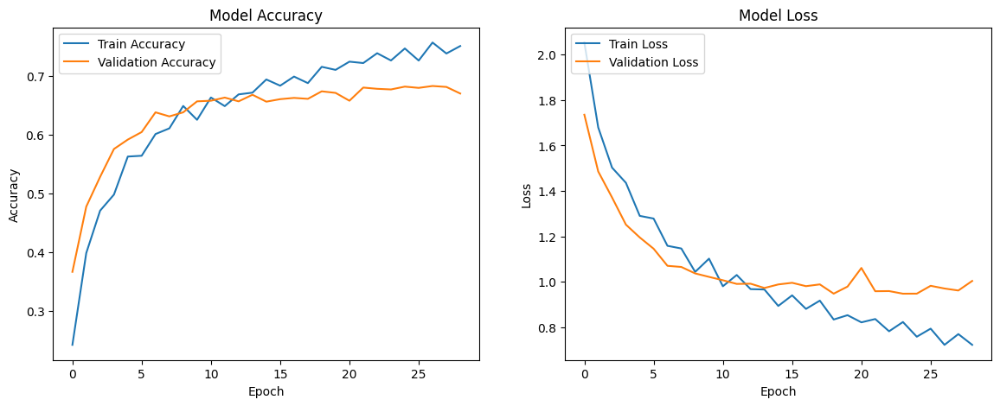

In [ ]:
%matplotlib inline
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))  # 1 row, 2 columns figure

# Plot accuracy
ax1.plot(history.history['acc'], label='Train Accuracy')
ax1.plot(history.history['val_acc'], label='Validation Accuracy')
ax1.set_title('Model Accuracy')
ax1.set_ylabel('Accuracy')
ax1.set_xlabel('Epoch')
ax1.legend(loc='upper left')

# Plot loss
ax2.plot(history.history['loss'], label='Train Loss')
ax2.plot(history.history['val_loss'], label='Validation Loss')
ax2.set_title('Model Loss')
ax2.set_ylabel('Loss')
ax2.set_xlabel('Epoch')
ax2.legend(loc='upper left')

plt.show()
# fig.savefig('Model_Accuracy.png')

# Result of Confusion Matrix


59/59 [==============================] - 0s 4ms/step


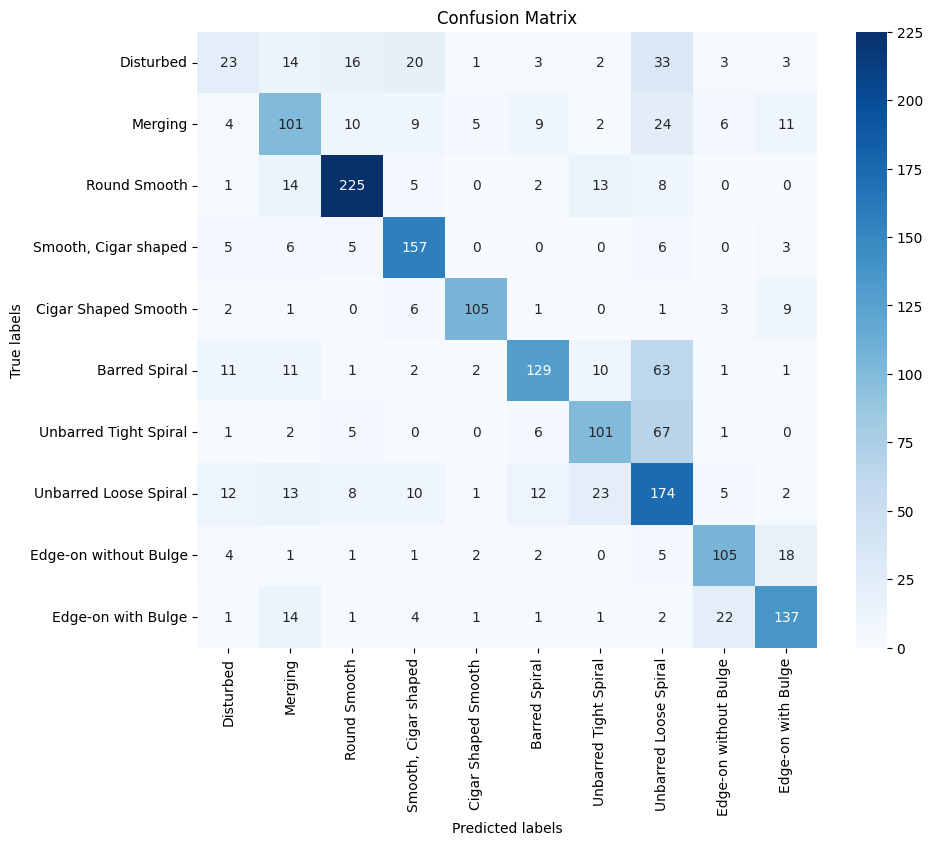

              precision    recall  f1-score   support

           0       0.36      0.19      0.25       118
           1       0.57      0.56      0.56       181
           2       0.83      0.84      0.83       268
           3       0.73      0.86      0.79       182
           4       0.90      0.82      0.86       128
           5       0.78      0.56      0.65       231
           6       0.66      0.55      0.60       183
           7       0.45      0.67      0.54       260
           8       0.72      0.76      0.74       139
           9       0.74      0.74      0.74       184

    accuracy                           0.67      1874
   macro avg       0.68      0.66      0.66      1874
weighted avg       0.68      0.67      0.67      1874



In [ ]:
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns

# Make predictions on the validation data and Print Confusion Matrix
val_predictions = model.predict(X_val)
# Convert predictions to class labels
val_predicted_labels = np.argmax(val_predictions, axis=1)
# Convert one-hot encoded labels to class labels
val_true_labels = np.argmax(val_labels, axis=1)

# Compute the confusion matrix
conf_matrix = confusion_matrix(val_true_labels, val_predicted_labels)

# Plot the confusion matrix as a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=features, yticklabels=features)
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')
plt.show()

report = classification_report(val_true_labels, val_predicted_labels)
print(report)



59/59 [==============================] - 0s 5ms/step


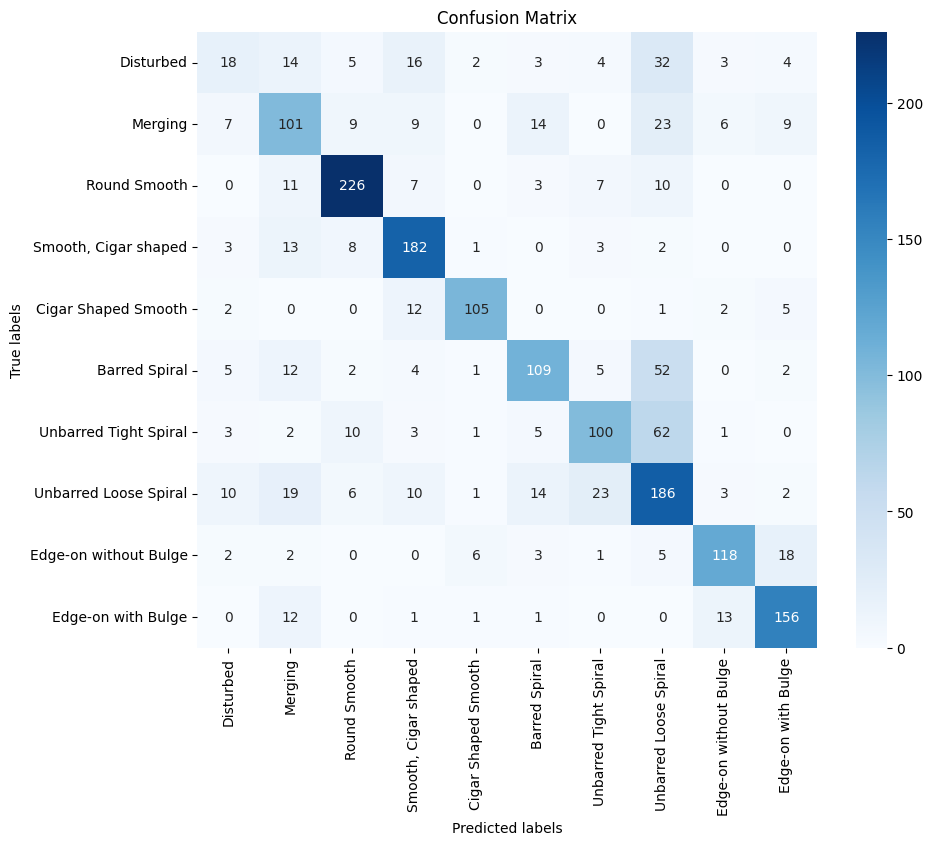

              precision    recall  f1-score   support

           0       0.36      0.19      0.25       118
           1       0.57      0.56      0.56       181
           2       0.83      0.84      0.83       268
           3       0.73      0.86      0.79       182
           4       0.90      0.82      0.86       128
           5       0.78      0.56      0.65       231
           6       0.66      0.55      0.60       183
           7       0.45      0.67      0.54       260
           8       0.72      0.76      0.74       139
           9       0.74      0.74      0.74       184

    accuracy                           0.67      1874
   macro avg       0.68      0.66      0.66      1874
weighted avg       0.68      0.67      0.67      1874



In [ ]:
# Make predictions on the Test data and plot confusion matrix
test_predictions = model.predict(X_test)
# Convert predictions to class labels
test_predicted_labels = np.argmax(test_predictions, axis=1)
# Convert one-hot encoded labels to class labels
test_true_labels = np.argmax(test_labels, axis=1)

# Compute the confusion matrix
conf_matrix = confusion_matrix(test_true_labels, test_predicted_labels)

# Plot the confusion matrix as a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=features, yticklabels=features)
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')
plt.show()

report = classification_report(val_true_labels, val_predicted_labels)
print(report)


# Testing on real data with Video

...Now Loading model from disk
Model Loading Completed


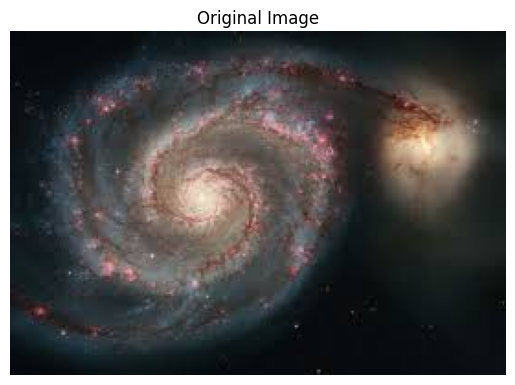

1/1 [==============================] - 0s 327ms/step
File: bb.jpeg
Predicted class: Barred Spiral
Probability: 0.6490313

Error: Unable to read image at GalaxyTest/.DS_Store
Skipping file: .DS_Store


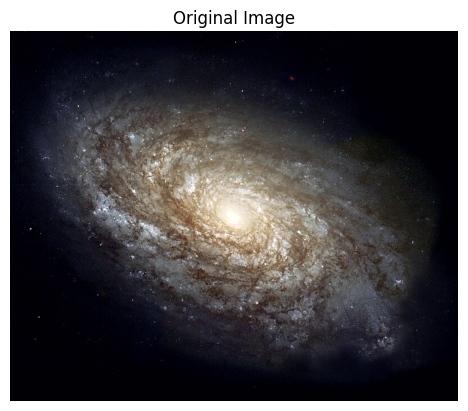

1/1 [==============================] - 0s 24ms/step
File: aa.jpeg
Predicted class: Unbarred Loose Spiral
Probability: 0.6810986

Error: File not found at GalaxyTest/.ipynb_checkpoints
Skipping file: .ipynb_checkpoints


In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from keras.models import model_from_json

#Lets Load the saved model architecture
with open("galaxy_model.json", "r") as json_file:
    loaded_model_json = json_file.read()

# Load the model architecture
loaded_model = model_from_json(loaded_model_json)


print("...Now Loading model from disk")

# Load the saved model weights
loaded_model.load_weights("best_model.h5")

print("Model Loading Completed")

# Function to preprocess images for classification
def preprocess_image(image_path):
    try:
        # Check if the image file exists
        if not os.path.isfile(image_path):
            print("Error: File not found at", image_path)
            return None
        # Read the image from the file path
        image = cv2.imread(image_path)
        # Check if the image is empty
        if image is None:
            print("Error: Unable to read image at", image_path)
            return None

        resized_image = cv2.resize(image, (128, 128))
        # Normalize the pixel values
        normalized_image = resized_image / 255.0
        # Expand dimensions to make it compatible with the model input shape
        preprocessed_image = np.expand_dims(normalized_image, axis=0)
        return preprocessed_image
    except Exception as e:
        print("Error:", e)
        return None


# Function to perform inference on test images
def test_model(test_folder):
    # List all files in the test folder
    test_files = os.listdir(test_folder)
    for file_name in test_files:
        # Construct the full file path
        file_path = os.path.join(test_folder, file_name)
        # Preprocess the image
        preprocessed_image = preprocess_image(file_path)
        # Check if preprocessing was successful
        if preprocessed_image is None:
            print("Skipping file:", file_name)
            continue
         # Display the image
        image = cv2.imread(file_path)
        plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        plt.title("Original Image")
        plt.axis('off')
        plt.show()

        # Perform prediction
        prediction = loaded_model.predict(preprocessed_image)
        # Get the predicted class index
        predicted_class_index = np.argmax(prediction)
        # Print the predicted class and probability
        print("File:", file_name)
        print("Predicted class:", features[predicted_class_index])
        print("Probability:", prediction[0][predicted_class_index])
        print()

# Test the model on a specified test folder
test_folder_path = "GalaxyTest"
test_model(test_folder_path)


In [ ]:
!pwd

/content/drive/MyDrive/GalaxyGem


In [ ]:
#import cv2 for jupyter notebook
import cv2
import numpy as np
from keras.models import model_from_json

class_dict = {0: "Distributed Galaxies",
              1: "Merging Galaxies",
              2: "Round Smooth Galaxies",
              3: "In-between Round Smooth Galaxies",
              4: "Cigar Shaped Smooth Galaxies",
              5: "Barred Spiral Galaxies",
              6: "Unbarred Tight Spiral Galaxies",
              7: "Unbarred Loose Spiral Galaxies",
              8: "Edge-on  Galaxies without Bulge",
              9: "Edge-on Galaxies with Bulge"}

# Load the trained model
with open("galaxy_model.json", "r") as json_file:
    loaded_model_json = json_file.read()

loaded_model = model_from_json(loaded_model_json)
loaded_model.load_weights("best_model.h5")
# Open the video file
cap = cv2.VideoCapture("vidTest.mp4")

# Duration (in frames) to show each image
image_duration = 2 * cap.get(cv2.CAP_PROP_FPS)

# Counter to track frames for each image
frame_count = 0

while True:
    # Read a frame from the video
    ret, frame = cap.read()
    if not ret:
        break  # Break out of the loop if there are no more frames to read

    frame = cv2.resize(frame, (128, 128))  # Resize to match the model's expected input shape

    # Display the class of the current image
    if frame_count < image_duration:
        # Preprocess the frame (if needed)
        # Perform prediction
        model_prediction = loaded_model.predict(np.expand_dims(frame, axis=0))
        maxindex = int(np.argmax(model_prediction))
        cv2.putText(frame, class_dict[maxindex], (10, 50), cv2.FONT_HERSHEY_PLAIN, 0.5, (255, 255, 255), 1, cv2.LINE_AA)
    else:
        frame_count = 0  # Reset the frame count for the next image

    frame_count += 1

    cv2.imshow('Image Classification', frame)

    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

# Release the video capture object and close all OpenCV windows
cap.release()
cv2.destroyAllWindows()



Output hidden; open in https://colab.research.google.com to view.

In [ ]:
from google.colab.patches import cv2_imshow #for colab
import numpy as np
from keras.models import model_from_json

class_dict = {0: "Distributed Galaxies",
              1: "Merging Galaxies",
              2: "Round Smooth Galaxies",
              3: "In-between Round Smooth Galaxies",
              4: "Cigar Shaped Smooth Galaxies",
              5: "Barred Spiral Galaxies",
              6: "Unbarred Tight Spiral Galaxies",
              7: "Unbarred Loose Spiral Galaxies",
              8: "Edge-on  Galaxies without Bulge",
              9: "Edge-on Galaxies with Bulge"}

# Load the trained model
with open("galaxy_model.json", "r") as json_file:
    loaded_model_json = json_file.read()

loaded_model = model_from_json(loaded_model_json)
loaded_model.load_weights("best_model.h5")

# Open the video file
cap = cv2.VideoCapture("vidTest.mp4")

# Duration (in frames) to show each image
image_duration = 2 * cap.get(cv2.CAP_PROP_FPS)

# Counter to track frames for each image
frame_count = 0
while True:
    # Capture frame-by-frame
    ret, frame = cap.read()

    # If the frame is empty, break the loop
    if not ret:
        break

    # Preprocess the frame as needed
    # (e.g., resize, normalize)
    processed_frame =  frame = cv2.resize(frame, (256, 256))

    # Predict the class of the frame
    prediction = model.predict(np.expand_dims(processed_frame, axis=0))
    predicted_class = class_dict[np.argmax(prediction)]

    # Display the predicted class on the frame
    cv2.putText(frame, predicted_class, (20, 20), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 255, 0), 2)

    # Display the resulting frame
    cv2_imshow( frame)

    # Press 'q' to quit
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

# Release the capture
cap.release()
cv2.destroyAllWindows()

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
!ls

sample_data


In [ ]:
!ls | grep best_model.h5
